In [ ]:
import os
import math
import copy
import time
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision.models as models
from torchvision import datasets, transforms
from torchvision.transforms import v2
from torch.optim.lr_scheduler import LambdaLR
from torch.utils.data import DataLoader, Subset

from tqdm.auto import tqdm

from sklearn.model_selection import train_test_split, KFold
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from scipy.optimize import minimize
from cleanlab.filter import find_label_issues

from torchmetrics.classification import (
    MulticlassPrecision,
    MulticlassRecall,
    MulticlassF1Score,
    MulticlassAccuracy,
 )

import wandb
import open_clip
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

Download datset

In [2]:
my_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

train_data = datasets.Food101(
    root="data",           
    split="train",         
    download=True,         
    #transform=my_transforms
)

test_data = datasets.Food101(
    root="data",
    split="test",
    download=True,
    #transform=my_transforms
)

print(f"Successfully loaded {len(train_data)} training images and {len(test_data)} testing images")

Successfully loaded 75750 training images and 25250 testing images


# EDA

Check maximum and minimum number of images per class

In [ ]:
labels = [train_data._labels[i] for i in range(len(train_data))]
counts = Counter(labels)

print(f"Max images per train class: {max(counts.values())}")
print(f"Min images per train class: {min(counts.values())}")

Max images per train class: 750
Min images per train class: 750


In [4]:
labels = [test_data._labels[i] for i in range(len(test_data))]
counts = Counter(labels)

print(f"Max images per test class: {max(counts.values())}")
print(f"Min images per test class: {min(counts.values())}")

Max images per test class: 250
Min images per test class: 250


As we can see, max number is equal to min number, so dataset is perfectly balanced, because distribution over the classes is uniform.

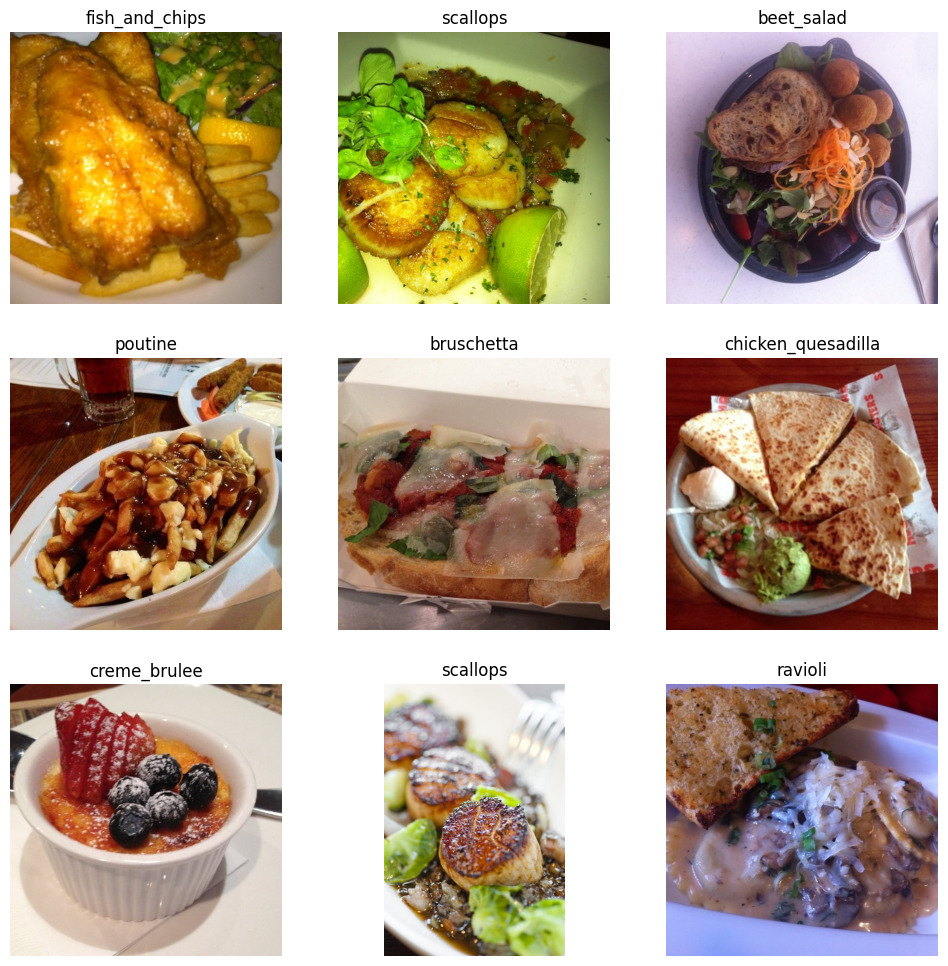

In [5]:
def show_samples(dataset, class_names, num_samples=9):
    plt.figure(figsize=(12, 12))
    for i in range(num_samples):
        idx = np.random.randint(len(dataset))
        img, label = dataset[idx]
        plt.subplot(3, 3, i+1)
        
        if not isinstance(img, np.ndarray) and not hasattr(img, 'permute'):
            plt.imshow(img) 
        else:
            plt.imshow(img.permute(1, 2, 0))
            
        plt.title(class_names[label])
        plt.axis("off")

show_samples(train_data, train_data.classes)

As we can see photos has different sizes, light, and objects is in different positions

In [6]:
print(f"{test_data.classes == train_data.classes} - class names are the same in both sets")
print(train_data.classes)

True - class names are the same in both sets
['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich',

All, good. We have no mistakes in classes downloading

In [ ]:
def check_dataset_integrity(dataset, num_to_check=10000):
    print(f"Checking integrity for {num_to_check}...")
    corrupt_indices = []
    
    indices = np.random.choice(len(dataset), num_to_check, replace=False)
    
    for idx in tqdm(indices):
        try:
            img, _ = dataset[idx]
            img.load()
        except Exception as e:
            print(f"Corrupt image found at index {idx}: {e}")
            corrupt_indices.append(idx)
            
    if not corrupt_indices:
        print("No corrupted images found.")
    return corrupt_indices
_ = check_dataset_integrity(train_data)

Checking integrity for 10000...


100%|██████████| 10000/10000 [00:09<00:00, 1051.47it/s]

No corrupted images found.


Also we can open images

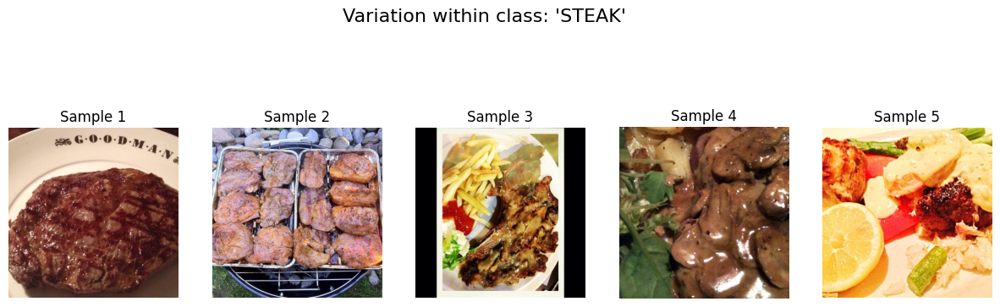

In [8]:
def visualize_label_noise(dataset, class_name, num_samples=5):
    class_idx = dataset.classes.index(class_name)
    indices = [i for i, label in enumerate(dataset._labels) if label == class_idx]
    selected_indices = np.random.choice(indices, num_samples, replace=False)
    
    plt.figure(figsize=(15, 5))
    plt.suptitle(f"Variation within class: '{class_name.upper()}'", fontsize=16)
    
    for i, idx in enumerate(selected_indices):
        img, _ = dataset[idx]
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Sample {i+1}")
    plt.show()

visualize_label_noise(train_data, "steak")

As we can see, there not clearly steak on every image, I am not sure that on 5 sample it is steak

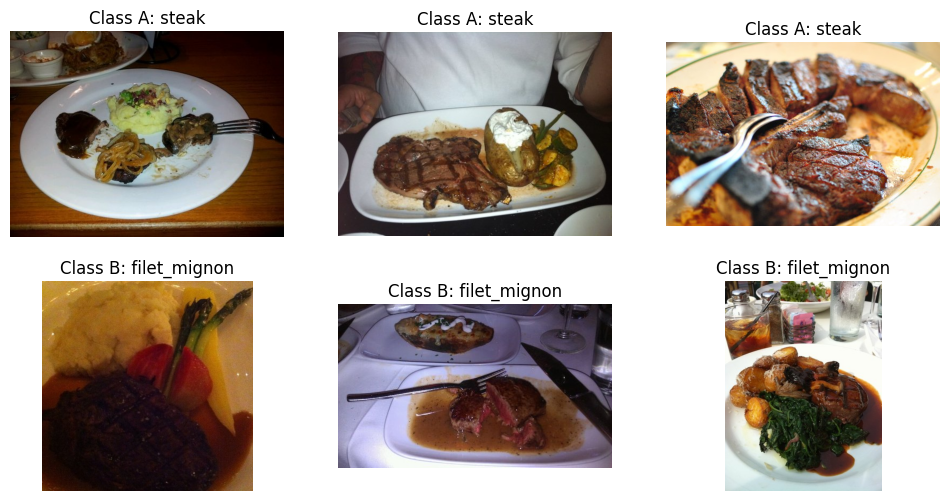

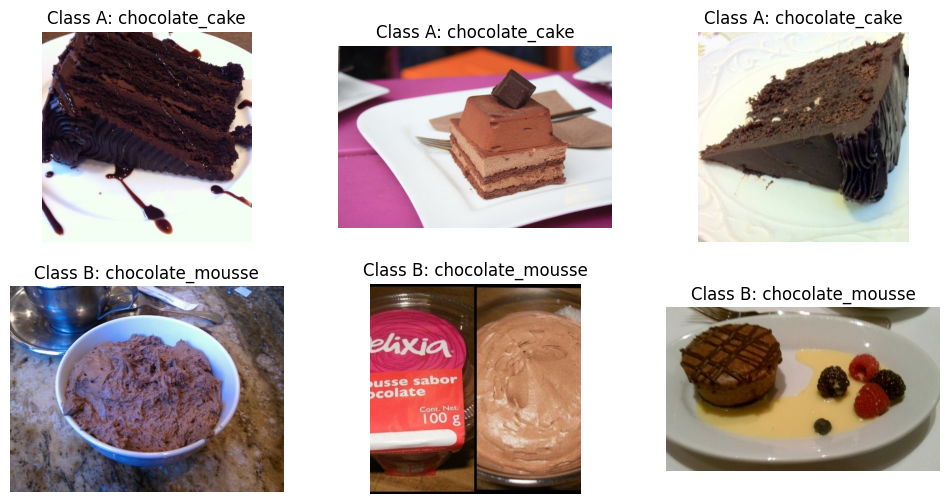

In [9]:
def compare_similar_classes(dataset, class_a, class_b, num_samples=3):
    idx_a = dataset.classes.index(class_a)
    idx_b = dataset.classes.index(class_b)
    
    indices_a = [i for i, l in enumerate(dataset._labels) if l == idx_a][:num_samples]
    indices_b = [i for i, l in enumerate(dataset._labels) if l == idx_b][:num_samples]
    
    plt.figure(figsize=(12, 6))
    for i in range(num_samples):
        plt.subplot(2, num_samples, i + 1)
        plt.imshow(dataset[indices_a[i]][0])
        plt.title(f"Class A: {class_a}")
        plt.axis("off")
        
        plt.subplot(2, num_samples, i + 1 + num_samples)
        plt.imshow(dataset[indices_b[i]][0])
        plt.title(f"Class B: {class_b}")
        plt.axis("off")
    plt.show()

compare_similar_classes(train_data, "steak", "filet_mignon")
compare_similar_classes(train_data, "chocolate_cake", "chocolate_mousse")

Also, as we can see, similar dishes looks very similar, like steak and filet mignon and whis this ligh we can not be sure what it is.

In [ ]:
NORMALIZE_MEAN = [0.485, 0.456, 0.406]
NORMALIZE_STD = [0.229, 0.224, 0.225]

train_transform = v2.Compose([
    v2.Resize(size=(224, 224), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToImage(), 
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=NORMALIZE_MEAN, std=NORMALIZE_STD),
])

test_transform = v2.Compose([
    v2.Resize(size=(224, 224), antialias=True),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=NORMALIZE_MEAN, std=NORMALIZE_STD),
])

mixup = v2.MixUp(num_classes=20)
cutmix = v2.CutMix(num_classes=20)

cutmix_or_mixup = v2.RandomChoice([mixup, cutmix])

train_data = datasets.Food101(
    root="data",
    split="train",
    download=True,
    transform=train_transform 
)

test_data = datasets.Food101(
    root="data",
    split="test",
    download=True,
    transform=test_transform
)

Here I have transformed all images to 224x224 because it is standart size for models and also add augmentations to train dataset, like horizontal flip and cutmix, mixup. Also I have normalized images.

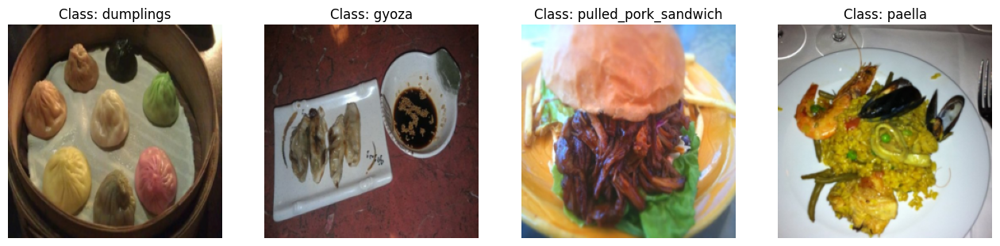

In [ ]:
def visualize_augmentations(dataset, num_samples=4):
    plt.figure(figsize=(16, 4))
    for i in range(num_samples):
        idx = np.random.randint(len(dataset))
        img, label = dataset[idx]
        img = img.permute(1, 2, 0).numpy()
        img = img * np.array(NORMALIZE_STD) + np.array(NORMALIZE_MEAN)
        img = np.clip(img, 0, 1)
        
        plt.subplot(1, num_samples, i+1)
        plt.imshow(img)
        plt.title(f"Class: {dataset.classes[label]}")
        plt.axis("off")
    plt.show()

visualize_augmentations(train_data)

Here we can see, that images are same size.

In [13]:
food_20_classes = [
    "donuts", "ice_cream", "pizza", "sushi", "hamburger","caesar_salad", "french_fries", "garlic_bread", "lasagna", "omelette",
    "strawberry_shortcake", "tiramisu", "tuna_tartare", "waffles", "samosa", "hot_dog", "french_onion_soup", "steak", "tacos", "pho"
]

class_to_idx = {cls: i for i, cls in enumerate(train_data.classes)}
subset_indices_map = [class_to_idx[cls] for cls in food_20_classes]

Here, I have try to take maximum different classes for better model performing, to avoid simularity and misclassification by models. 

In [ ]:
def get_subset_indices(dataset, target_classes_indices):
    indices = []
    for i, label in enumerate(dataset._labels):
        if label in target_classes_indices:
            indices.append(i)
    return indices

train_20_indices = get_subset_indices(train_data, subset_indices_map)
test_20_indices = get_subset_indices(test_data, subset_indices_map)

food20_train = Subset(train_data, train_20_indices)
food20_test = Subset(test_data, test_20_indices)

print(f"Total train images in Food 20: {len(food20_train)}")

Total train images in Food 20: 15000


In [15]:
class Food20Wrapper(torch.utils.data.Dataset):
    def __init__(self, subset, class_map):
        self.subset = subset
        self.mapping = {old_idx: new_idx for new_idx, old_idx in enumerate(class_map)}
        
    def __getitem__(self, index):
        img, label = self.subset[index]
        return img, self.mapping[label]
        
    def __len__(self):
        return len(self.subset)

train_20 = Food20Wrapper(food20_train, subset_indices_map)
test_20 = Food20Wrapper(food20_test, subset_indices_map)

Here i have add mapping for indexes, to have correct structure with augmentations.

In [ ]:
def val_split_stratified(dataset, split_ratio=0.8):
    indices = np.arange(len(dataset))
    labels = [dataset[i][1] for i in indices]
    
    train_indices, val_indices = train_test_split(
        indices,
        train_size=split_ratio,
        stratify=labels,
        random_state=42
    )
    
    return Subset(dataset, train_indices), Subset(dataset, val_indices)

train_subset, val_subset = val_split_stratified(train_20)

After, I have splitted train dataset on train and validation to see performance on every epoch.

# Resnet, Effnet, VIT

In [ ]:
device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")
print(f"device: {device}")

def create_model(model_name, num_classes=20, device=device):
    if model_name == "resnet":
        model = models.resnet50(weights="DEFAULT")
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif model_name == "efficientnet":
        model = models.efficientnet_b0(weights="DEFAULT")
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    elif model_name == "vit":
        model = models.vit_b_16(weights="DEFAULT")
        model.heads.head = nn.Linear(model.heads.head.in_features, num_classes)
    
    return model.to(device)

device: mps


I have created model like resnet50, effnet_b0 and vit_b_16

In [18]:
def train_one_epoch(model, loader, optimizer, criterion, mixer, device):
    model.train()
    total_loss = 0
    correct = 0
    total = 0
    
    for inputs, labels in loader:
        inputs, labels = inputs.to(device), labels.to(device)
        inputs, mixed_labels = mixer(inputs, labels)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, mixed_labels)

        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
        
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
    avg_loss = total_loss / len(loader)
    train_acc = 100. * correct / total
    
    return avg_loss, train_acc

That is code for 1 epoch training.

In [ ]:
accuracy_metric = MulticlassAccuracy(num_classes=20).to(device)
precision_metric = MulticlassPrecision(num_classes=20, average='macro').to(device)
recall_metric = MulticlassRecall(num_classes=20, average='macro').to(device)
f1_metric = MulticlassF1Score(num_classes=20, average='macro').to(device)


@torch.no_grad()
def validate_with_metrics(model, loader, device):
    model.eval()
    
    accuracy_metric.reset()
    precision_metric.reset()
    recall_metric.reset()
    f1_metric.reset()
    
    correct = 0
    total = 0
    
    for inputs, labels in loader:
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)
        
        accuracy_metric.update(preds, labels)
        precision_metric.update(preds, labels)
        recall_metric.update(preds, labels)
        f1_metric.update(preds, labels)
        
        total += labels.size(0)
        correct += preds.eq(labels).sum().item()
    
    acc = accuracy_metric.compute().item() * 100
    precision = precision_metric.compute().item() * 100
    recall = recall_metric.compute().item() * 100
    f1 = f1_metric.compute().item() * 100
    
    return acc, precision, recall, f1

Also I have added to accuracy precision,recall and f1, here I thouth that this can be helpfull(but in fact no).

In [ ]:
def train_model_constant_lr(model_name, train_loader, val_loader, epochs=5, lr=1e-4):
    print(f"\n {model_name.upper()}")
    
    model = create_model(model_name, num_classes=20, device=device)
    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=0.05)
    criterion = torch.nn.CrossEntropyLoss(label_smoothing=0.1).to(device)

    history = {
        "model": model_name,
        "epoch": [],
        "train_loss": [],
        "train_acc": [],
        "val_acc": [],
        "val_f1": [],
        "val_precision": [],
        "val_recall": []
    }
    
    best_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    start_time = time.time()

    epoch_bar = tqdm(range(epochs), desc=f"{model_name.upper()} epochs", unit="epoch")
    for epoch in epoch_bar:
        avg_loss, train_acc = train_one_epoch(
            model, train_loader, optimizer, criterion, cutmix_or_mixup, device
        )

        val_acc, val_p, val_r, val_f1 = validate_with_metrics(model, val_loader, device)

        history["epoch"].append(epoch + 1)
        history["train_loss"].append(avg_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)
        history["val_f1"].append(val_f1)
        history["val_precision"].append(val_p)
        history["val_recall"].append(val_r)

        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {avg_loss:.4f}, Train Acc: {train_acc:.2f}%, Val Acc: {val_acc:.2f}%")

        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = copy.deepcopy(model.state_dict())
            print(f"Best Val Acc: {best_acc:.2f}%")

        epoch_bar.set_postfix(loss=f"{avg_loss:.4f}", train_acc=f"{train_acc:.2f}%", val_acc=f"{val_acc:.2f}%")
    model.load_state_dict(best_model_wts)
    
    total_time = time.time() - start_time
    return history, best_acc, total_time, model

And start simple training for this models, all best models are saved loccaly and performance saved to df. 

In [ ]:
train_loader = DataLoader(train_subset, batch_size=32, shuffle=True, num_workers=0, drop_last=True)
val_loader = DataLoader(val_subset, batch_size=64, shuffle=False, num_workers=0)
test_loader = DataLoader(test_20, batch_size=64, shuffle=False, num_workers=0)

model_names = ["resnet", "efficientnet", "vit"]
comparison_results = []
all_histories = []

os.makedirs("saved_models", exist_ok=True)

for name in model_names:
    history, best_val_acc, duration, best_model = train_model_constant_lr(
        name, train_loader, val_loader, epochs=5, lr=1e-4
    )
    
    save_path = f"saved_models/{name}_best.pth"
    torch.save(best_model.state_dict(), save_path)
    print(f"Saved best {name.upper()} model to {save_path}")

    all_histories.append(pd.DataFrame(history))
    
    print(f"evaluating {name.upper()} on test...")
    test_acc, test_p, test_r, test_f1 = validate_with_metrics(best_model, test_loader, device)

    num_params = sum(p.numel() for p in best_model.parameters()) / 1e6
    
    comparison_results.append({
        "Model": name.upper(),
        "Best Val Acc": f"{best_val_acc:.2f}%",
        "Test Acc": f"{test_acc:.2f}%",
        "Test F1": f"{test_f1:.2f}%",
        "Params (M)": f"{num_params:.2f}M",
        "Train Time (s)": f"{duration:.1f}s"
    })

df_final = pd.DataFrame(comparison_results)
df_history = pd.concat(all_histories, ignore_index=True)

print("---")
print(df_final.to_string(index=False))


 RESNET


RESNET epochs:   0%|          | 0/5 [00:00<?, ?epoch/s]

Epoch 1/5 - Train Loss: 2.1701, Train Acc: 40.98%, Val Acc: 86.03%
Best Val Acc: 86.03%
Epoch 2/5 - Train Loss: 1.7122, Train Acc: 55.79%, Val Acc: 88.70%
Best Val Acc: 88.70%
Epoch 3/5 - Train Loss: 1.6117, Train Acc: 56.01%, Val Acc: 89.20%
Best Val Acc: 89.20%
Epoch 4/5 - Train Loss: 1.5851, Train Acc: 56.42%, Val Acc: 89.63%
Best Val Acc: 89.63%
Epoch 5/5 - Train Loss: 1.5066, Train Acc: 59.16%, Val Acc: 89.83%
Best Val Acc: 89.83%
Saved best RESNET model to saved_models/resnet_best.pth
evaluating RESNET on test...

 EFFICIENTNET


EFFICIENTNET epochs:   0%|          | 0/5 [00:00<?, ?epoch/s]

Epoch 1/5 - Train Loss: 2.4240, Train Acc: 31.22%, Val Acc: 78.23%
Best Val Acc: 78.23%
Epoch 2/5 - Train Loss: 1.9470, Train Acc: 44.58%, Val Acc: 84.07%
Best Val Acc: 84.07%
Epoch 3/5 - Train Loss: 1.8846, Train Acc: 47.58%, Val Acc: 86.10%
Best Val Acc: 86.10%
Epoch 4/5 - Train Loss: 1.7735, Train Acc: 52.92%, Val Acc: 87.87%
Best Val Acc: 87.87%
Epoch 5/5 - Train Loss: 1.7609, Train Acc: 52.28%, Val Acc: 88.23%
Best Val Acc: 88.23%
Saved best EFFICIENTNET model to saved_models/efficientnet_best.pth
evaluating EFFICIENTNET on test...

 VIT


VIT epochs:   0%|          | 0/5 [00:00<?, ?epoch/s]

Epoch 1/5 - Train Loss: 1.9924, Train Acc: 46.09%, Val Acc: 84.43%
Best Val Acc: 84.43%
Epoch 2/5 - Train Loss: 1.7035, Train Acc: 55.38%, Val Acc: 81.50%
Epoch 3/5 - Train Loss: 1.5899, Train Acc: 54.95%, Val Acc: 87.90%
Best Val Acc: 87.90%
Epoch 4/5 - Train Loss: 1.5609, Train Acc: 59.08%, Val Acc: 87.73%
Epoch 5/5 - Train Loss: 1.4665, Train Acc: 60.73%, Val Acc: 87.13%
Saved best VIT model to saved_models/vit_best.pth
evaluating VIT on test...
---
       Model Best Val Acc Test Acc Test F1 Params (M) Train Time (s)
      RESNET       89.83%   92.88%  92.88%     23.55M        1793.7s
EFFICIENTNET       88.23%   90.86%  90.83%      4.03M        1113.8s
         VIT       87.90%   91.28%  91.31%     85.81M        6205.0s


As we can see, the best result has been shown by resnet on test, all of models has bad scores on train, but this because I am using cutmix, mixup and model can not overfit(fit) to train dataset, thats mean more rubustness.

In [ ]:
resnet_path = "saved_models/resnet_best.pth"
resnet_model = create_model("resnet", num_classes=20) 
resnet_model.load_state_dict(torch.load(resnet_path, map_location=device))
resnet_model.eval()

@torch.no_grad()
def audit_dataset(model, loader, device):
    model.eval()
    all_probs = []
    all_labels = []
    all_features = []

    features = []
    def hook(module, input, output):
        features.append(output.squeeze())

    handle = model.avgpool.register_forward_hook(hook)
    
    for inputs, labels in tqdm(loader, desc="Auditing Dataset"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        
        all_probs.append(torch.softmax(outputs, dim=1).cpu().numpy())
        all_labels.append(labels.cpu().numpy())
        all_features.append(features[-1].cpu().numpy())
        
    handle.remove()
    return np.concatenate(all_probs), np.concatenate(all_labels), np.concatenate(all_features)

audit_loader = DataLoader(train_subset, batch_size=32, shuffle=False)
pred_probs, true_labels, embeddings = audit_dataset(resnet_model, audit_loader, device)

label_issues = find_label_issues(
    labels=true_labels,
    pred_probs=pred_probs,
    return_indices_ranked_by="self_confidence"
 )

iso_forest = IsolationForest(contamination=0.02, random_state=42)
outlier_preds = iso_forest.fit_predict(embeddings)
outlier_indices = np.where(outlier_preds == -1)[0]

print(f"Cleanlab found {len(label_issues)} label issues.")
print(f"Isolation Forest found {len(outlier_indices)} morphological outliers.")

Auditing Dataset:   0%|          | 0/375 [00:00<?, ?it/s]

Cleanlab found 7 label issues.
Isolation Forest found 240 morphological outliers.


Here, I have tried to use resnet as best performance model to detect label issues 
as the model's embeddings before it makes its final guess. I use Cleanlab, to inspect confidence and get ranked list. Also I have used Isolation Forest to check by embeddings what images can be mislabeled, it taked like the most far image.

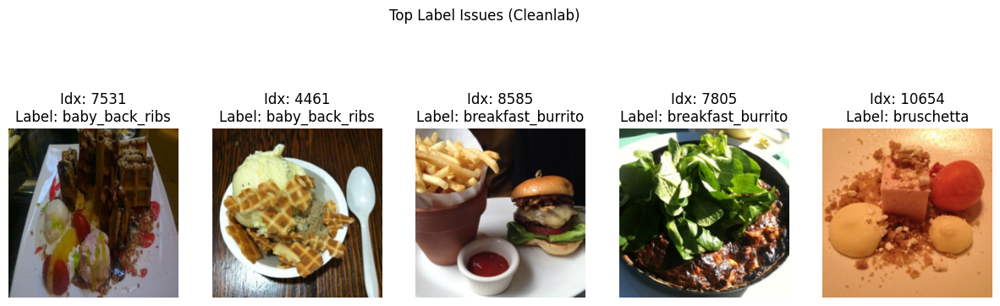

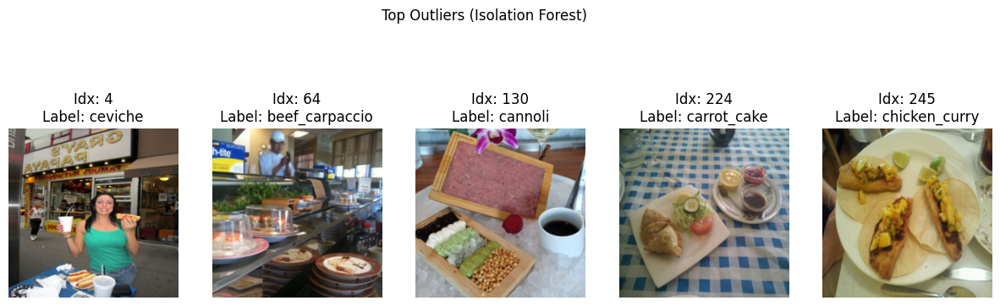

In [24]:
def plot_issues(indices, title):
    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(indices[:5]):
        img, label = train_subset[idx]
        img = img.permute(1, 2, 0).numpy() * NORMALIZE_STD + NORMALIZE_MEAN
        plt.subplot(1, 5, i+1)
        plt.imshow(np.clip(img, 0, 1))
        plt.title(f"Idx: {idx}\nLabel: {train_data.classes[label]}")
        plt.axis('off')
    plt.suptitle(title)
    plt.show()

plot_issues(label_issues, "Top Label Issues (Cleanlab)")
plot_issues(outlier_indices, "Top Outliers (Isolation Forest)")

And as we can see, it looks like our approach make good job.

In [ ]:
bad_indices = set(label_issues).union(set(outlier_indices))
all_indices = set(range(len(train_subset)))
clean_indices = list(all_indices - bad_indices)

purified_train_subset = torch.utils.data.Subset(train_subset, clean_indices)

purified_train_loader = DataLoader(purified_train_subset, batch_size=32, shuffle=True)

print(f"Original: {len(train_subset)} -> Purified: {len(purified_train_subset)}")

Original: 12000 -> Purified: 11753


We deleted this images

In [ ]:
purified_train_loader = DataLoader(purified_train_subset, batch_size=32, shuffle=True, num_workers=0, drop_last=True)
val_loader = DataLoader(val_subset, batch_size=64, shuffle=False, num_workers=0)
test_loader = DataLoader(test_20, batch_size=64, shuffle=False, num_workers=0)

model_names = ["resnet"]
comparison_results = []
all_histories = []

os.makedirs("saved_models", exist_ok=True)

for name in model_names:
    history, best_val_acc, duration, best_model = train_model_constant_lr(
        name, purified_train_loader, val_loader, epochs=5, lr=1e-4
    )
    
    save_path = f"saved_models/purified_{name}_best.pth"
    torch.save(best_model.state_dict(), save_path)
    print(f"Saved best purified{name.upper()} model to {save_path}")

    all_histories.append(pd.DataFrame(history))
    
    print(f"evaluating {name.upper()} on test...")
    test_acc, test_p, test_r, test_f1 = validate_with_metrics(best_model, test_loader, device)

    num_params = sum(p.numel() for p in best_model.parameters()) / 1e6
    
    comparison_results.append({
        "Model": name.upper(),
        "Best Val Acc": f"{best_val_acc:.2f}%",
        "Test Acc": f"{test_acc:.2f}%",
        "Test F1": f"{test_f1:.2f}%",
        "Params (M)": f"{num_params:.2f}M",
        "Train Time (s)": f"{duration:.1f}s"
    })

df_purified = pd.DataFrame(comparison_results)
df_history = pd.concat(all_histories, ignore_index=True)

print("---")
print(df_purified.to_string(index=False))


 RESNET


RESNET epochs:   0%|          | 0/5 [00:00<?, ?epoch/s]

Epoch 1/5 - Train Loss: 2.1648, Train Acc: 41.03%, Val Acc: 83.37%
Best Val Acc: 83.37%
Epoch 2/5 - Train Loss: 1.7131, Train Acc: 52.00%, Val Acc: 86.57%
Best Val Acc: 86.57%
Epoch 3/5 - Train Loss: 1.6142, Train Acc: 55.88%, Val Acc: 88.47%
Best Val Acc: 88.47%
Epoch 4/5 - Train Loss: 1.5654, Train Acc: 56.08%, Val Acc: 88.97%
Best Val Acc: 88.97%
Epoch 5/5 - Train Loss: 1.4985, Train Acc: 56.45%, Val Acc: 89.47%
Best Val Acc: 89.47%
Saved best purifiedRESNET model to saved_models/purified_resnet_best.pth
evaluating RESNET on test...
---
 Model Best Val Acc Test Acc Test F1 Params (M) Train Time (s)
RESNET       89.47%   92.64%  92.61%     23.55M        1979.2s


but after retraining, performans get little whorse. Here I thought maybe that because resnet can find few images and decide to try clip.

In [ ]:
def get_heavy_embeddings(loader, device):
    model, _, preprocess = open_clip.create_model_and_transforms(
        'ViT-L-14', pretrained='openai'
    )
    model = model.to(device)
    model.eval()
    
    all_features = []
    
    with torch.no_grad():
        for inputs, _ in tqdm(loader, desc="Heavy Audit"):
            inputs = inputs.to(device)
            feature = model.encode_image(inputs)
            all_features.append(feature.cpu().numpy())
            
    return np.concatenate(all_features)

heavy_embeddings = get_heavy_embeddings(audit_loader, device)

iso_forest = IsolationForest(contamination=0.03, random_state=42)
outlier_preds = iso_forest.fit_predict(heavy_embeddings)
heavy_outlier_indices = np.where(outlier_preds == -1)[0]

print(f"Isolation Forest found {len(heavy_outlier_indices)} morphological outliers.")

bad_clip_indices = set(label_issues).union(set(heavy_outlier_indices))
all_indices = set(range(len(train_subset)))
clean_clip_indices = list(all_indices - bad_clip_indices)

purified_clip_train_subset = torch.utils.data.Subset(train_subset, clean_clip_indices)

purified_clip_train_loader = DataLoader(purified_clip_train_subset, batch_size=32, shuffle=True)

print(f"Original: {len(train_subset)} -> Purified: {len(purified_clip_train_subset)}")

val_loader = DataLoader(val_subset, batch_size=64, shuffle=False, num_workers=0)
test_loader = DataLoader(test_20, batch_size=64, shuffle=False, num_workers=0)

model_names = ["resnet"]
comparison_results = []
all_histories = []

os.makedirs("saved_models", exist_ok=True)

for name in model_names:
    history, best_val_acc, duration, best_model = train_model_constant_lr(
        name, purified_clip_train_loader, val_loader, epochs=5, lr=1e-4
    )
    
    save_path = f"saved_models/purified_clip_{name}_best.pth"
    torch.save(best_model.state_dict(), save_path)
    print(f"Saved best purified clip {name.upper()} model to {save_path}")

    all_histories.append(pd.DataFrame(history))
    
    print(f"evaluating {name.upper()} on test...")
    test_acc, test_p, test_r, test_f1 = validate_with_metrics(best_model, test_loader, device)

    num_params = sum(p.numel() for p in best_model.parameters()) / 1e6
    
    comparison_results.append({
        "Model": name.upper(),
        "Best Val Acc": f"{best_val_acc:.2f}%",
        "Test Acc": f"{test_acc:.2f}%",
        "Test F1": f"{test_f1:.2f}%",
        "Params (M)": f"{num_params:.2f}M",
        "Train Time (s)": f"{duration:.1f}s"
    })

df_clip_purified = pd.DataFrame(comparison_results)
df_history = pd.concat(all_histories, ignore_index=True)

print("---")
print(df_clip_purified.to_string(index=False))


open_clip_model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Heavy Audit:   0%|          | 0/375 [00:00<?, ?it/s]

Isolation Forest found 360 morphological outliers.
Original: 12000 -> Purified: 11634

 RESNET


RESNET epochs:   0%|          | 0/5 [00:00<?, ?epoch/s]

Epoch 1/5 - Train Loss: 2.1537, Train Acc: 40.83%, Val Acc: 84.27%
Best Val Acc: 84.27%
Epoch 2/5 - Train Loss: 1.7133, Train Acc: 51.60%, Val Acc: 87.17%
Best Val Acc: 87.17%
Epoch 3/5 - Train Loss: 1.6090, Train Acc: 57.63%, Val Acc: 88.57%
Best Val Acc: 88.57%
Epoch 4/5 - Train Loss: 1.5372, Train Acc: 58.18%, Val Acc: 88.90%
Best Val Acc: 88.90%
Epoch 5/5 - Train Loss: 1.5221, Train Acc: 58.60%, Val Acc: 89.53%
Best Val Acc: 89.53%
Saved best purified clip RESNET model to saved_models/purified_clip_resnet_best.pth
evaluating RESNET on test...
---
 Model Best Val Acc Test Acc Test F1 Params (M) Train Time (s)
RESNET       89.53%   92.46%  92.43%     23.55M        2074.0s


The main logic is the same, I take clip embeddings and isolation forest rate is higher but result also little whorse. I think it could has 2 reasons, maybe because it makes model better ready to val and test dataset, like to real world or maybe it drops hardest embeddings not farest. 

# Freasing, scheduling

To prevent ovefitting on subsets, save compute and time and validate pipeline logic, I have runned next 2 tasks on resnet18. I understand that we will have lower accuracy, but we will show best methods that will work using this.

In [ ]:
def build_resnet_model(num_classes, pretrained=True):
    model = models.resnet18(
        weights=models.ResNet18_Weights.DEFAULT if pretrained else None
    )
    in_features = model.fc.in_features
    model.fc = nn.Linear(in_features, num_classes)
    return model

def freeze_all(model):
    for p in model.parameters():
        p.requires_grad = False

def unfreeze_module(module):
    for p in module.parameters():
        p.requires_grad = True

def set_trainable_layers_resnet(model, stage):
    """
    stage 0: only fc
    stage 1: layer4 + fc
    stage 2: layer3 + layer4 + fc
    stage 3: full model
    """
    freeze_all(model)

    unfreeze_module(model.fc)

    if stage >= 1:
        unfreeze_module(model.layer4)
    if stage >= 2:
        unfreeze_module(model.layer3)
    if stage >= 3:
        unfreeze_module(model.layer2)
        unfreeze_module(model.layer1)
        unfreeze_module(model.conv1)
        if model.bn1 is not None:
            unfreeze_module(model.bn1)

def get_cosine_warmup_scheduler(optimizer, warmup_steps, total_steps):
    def lr_lambda(current_step):
        if current_step < warmup_steps:
            return float(current_step + 1) / float(max(1, warmup_steps))
        
        progress = float(current_step - warmup_steps) / float(max(1, total_steps - warmup_steps))
        return max(0.0, 0.5 * (1.0 + math.cos(math.pi * progress)))
    
    return LambdaLR(optimizer, lr_lambda)


def get_linear_warmup_scheduler(optimizer, warmup_steps, total_steps):
    def lr_lambda(current_step):
        if current_step < warmup_steps:
            return float(current_step + 1) / float(max(1, warmup_steps))
        
        progress = float(current_step - warmup_steps) / float(max(1, total_steps - warmup_steps))
        return max(0.0, 1.0 - progress)
    
    return LambdaLR(optimizer, lr_lambda)

def train_one_epoch(model, loader, criterion, optimizer, scheduler, device, mixer=None):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    lr_history = []

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        if mixer is not None:
            images, mixed_labels = mixer(images, labels)
            outputs = model(images)
            if mixed_labels.ndim == 2:
                loss = -(mixed_labels * F.log_softmax(outputs, dim=1)).sum(dim=1).mean()
            else:
                loss = criterion(outputs, mixed_labels)
        else:
            outputs = model(images)
            loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        if scheduler is not None:
            scheduler.step()
            lr_history.append(optimizer.param_groups[0]["lr"] )
        else:
            lr_history.append(optimizer.param_groups[0]["lr"] )

        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = 100.0 * correct / total
    return epoch_loss, epoch_acc, lr_history


@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * images.size(0)
        preds = outputs.argmax(dim=1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = 100.0 * correct / total
    return epoch_loss, epoch_acc

Here I have used resnet18, By default, it downloads the pre-trained ImageNet weights  which gives the model a massive head start because it already knows how to recognize basic shapes, textures, and patterns. I remove the original final layer and replaces it with a fresh, untrained nn.Linear layer that matches dataset. I have divided progressive unfreezing on 4 parts:

0: Everything is frozen except head.

1: Unfreese layer 4, model niw learn high-kevel features. 

2: unfreeze layer3, allowing medium-level features to adjust.

3: The entire model is unfrozen for full fine-tuning.

I have used 2 losses Cosine and Linear. It is very close, linear goes like strigt line and Cosine like "s" in but from left to right.

Also I have use warmup for loss. Both schedulers start the learning rate at essentially zero and gradually increase it over the first few steps. This prevents the model from making massive, destabilizing updates at the very beginning of training when the loss is highest.

In [ ]:
def train_resnet_progressive_unfreezing(
    train_loader,
    val_loader,
    num_classes,
    device,
    scheduler_type="cosine",  
    base_lr=1e-4,
    weight_decay=1e-4,
    warmup_ratio=0.1,
    stage_epochs=(2, 2, 2, 2), 
):
    model = build_resnet_model(num_classes=num_classes, pretrained=True).to(device)
    criterion = nn.CrossEntropyLoss()

    history = []
    full_lr_history = []
    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())

    total_train_steps = sum(stage_epochs) * len(train_loader)
    global_step_offset = 0
    start_time = time.time()

    for stage, n_epochs in enumerate(stage_epochs):
        print(f"\n=== Stage {stage} | epochs={n_epochs} ===")
        set_trainable_layers_resnet(model, stage)

        trainable_params = [p for p in model.parameters() if p.requires_grad]
        optimizer = optim.AdamW(trainable_params, lr=base_lr, weight_decay=weight_decay)

        stage_steps = n_epochs * len(train_loader)
        warmup_steps = max(1, int(warmup_ratio * stage_steps))

        if scheduler_type == "cosine":
            scheduler = get_cosine_warmup_scheduler(
                optimizer=optimizer,
                warmup_steps=warmup_steps,
                total_steps=stage_steps
            )
        elif scheduler_type == "linear":
            scheduler = get_linear_warmup_scheduler(
                optimizer=optimizer,
                warmup_steps=warmup_steps,
                total_steps=stage_steps
            )
        else:
            raise ValueError("scheduler_type must be 'cosine' or 'linear'")

        for epoch_in_stage in range(n_epochs):
            epoch_num = sum(stage_epochs[:stage]) + epoch_in_stage + 1

            train_loss, train_acc, epoch_lr_hist = train_one_epoch(
                model, train_loader, criterion, optimizer, scheduler, device, mixer=cutmix_or_mixup
            )
            val_loss, val_acc = evaluate(model, val_loader, criterion, device)

            full_lr_history.extend(epoch_lr_hist)

            history.append({
                "epoch": epoch_num,
                "stage": stage,
                "train_loss": train_loss,
                "train_acc": train_acc,
                "val_loss": val_loss,
                "val_acc": val_acc,
                "scheduler": scheduler_type
            })

            print(
                f"Epoch {epoch_num:02d} | "
                f"train_loss={train_loss:.4f} train_acc={train_acc:.2f}% | "
                f"val_loss={val_loss:.4f} val_acc={val_acc:.2f}%"
            )

            if val_acc > best_val_acc:
                best_val_acc = val_acc
                best_model_wts = copy.deepcopy(model.state_dict())

        global_step_offset += stage_steps

    total_time = time.time() - start_time
    model.load_state_dict(best_model_wts)

    return model, history, best_val_acc, total_time, full_lr_history

In [42]:
num_classes = 20

train_loader = DataLoader(train_subset, batch_size=32, shuffle=True, num_workers=0, drop_last=True)
val_loader = DataLoader(val_subset, batch_size=64, shuffle=False, num_workers=0)
test_loader = DataLoader(test_20, batch_size=64, shuffle=False, num_workers=0)

results_progressive = []
histories_progressive = []
lr_curves = {}

for scheduler_name in ["cosine", "linear"]:
    print(f"\n\ntraining with {scheduler_name.upper()} scheduler ")

    best_model, history, best_val_acc, duration, lr_history = train_resnet_progressive_unfreezing(
        train_loader=train_loader,
        val_loader=val_loader,
        num_classes=num_classes,
        device=device,
        scheduler_type=scheduler_name,
        base_lr=1e-4,
        weight_decay=1e-4,
        warmup_ratio=0.1,
        stage_epochs=(2, 2, 2, 2) 
    )

    test_acc, test_p, test_r, test_f1 = validate_with_metrics(best_model, test_loader, device)

    save_path = f"saved_models/resnet_progressive_{scheduler_name}.pth"
    torch.save(best_model.state_dict(), save_path)

    results_progressive.append({
        "Setup": f"ResNet + Progressive + {scheduler_name.capitalize()}",
        "Best Val Acc": f"{best_val_acc:.2f}%",
        "Test Acc": f"{test_acc:.2f}%",
        "Test F1": f"{test_f1:.2f}%",
        "Train Time (s)": f"{duration:.1f}s"
    })

    hist_df = pd.DataFrame(history)
    histories_progressive.append(hist_df)
    lr_curves[scheduler_name] = lr_history

df_progressive = pd.DataFrame(results_progressive)
display(df_progressive)



training with COSINE scheduler 

=== Stage 0 | epochs=2 ===
Epoch 01 | train_loss=2.9802 train_acc=8.38% | val_loss=2.7115 val_acc=21.30%
Epoch 02 | train_loss=2.8052 train_acc=14.37% | val_loss=2.6254 val_acc=25.70%

=== Stage 1 | epochs=2 ===
Epoch 03 | train_loss=2.0601 train_acc=34.68% | val_loss=0.9168 val_acc=76.60%
Epoch 04 | train_loss=1.7715 train_acc=43.90% | val_loss=0.8904 val_acc=78.10%

=== Stage 2 | epochs=2 ===
Epoch 05 | train_loss=1.7469 train_acc=45.67% | val_loss=0.7931 val_acc=80.17%
Epoch 06 | train_loss=1.6061 train_acc=50.61% | val_loss=0.7359 val_acc=82.17%

=== Stage 3 | epochs=2 ===
Epoch 07 | train_loss=1.6045 train_acc=51.33% | val_loss=0.7147 val_acc=82.20%
Epoch 08 | train_loss=1.4822 train_acc=54.24% | val_loss=0.6867 val_acc=83.53%


training with LINEAR scheduler 

=== Stage 0 | epochs=2 ===
Epoch 01 | train_loss=3.0002 train_acc=7.73% | val_loss=2.7512 val_acc=19.00%
Epoch 02 | train_loss=2.8347 train_acc=13.39% | val_loss=2.6391 val_acc=25.57%

===

,Setup,Best Val Acc,Test Acc,Test F1,Train Time (s)
0,ResNet + Progressive + Cosine,83.53%,87.84%,87.74%,741.1s
1,ResNet + Progressive + Linear,84.53%,87.72%,87.63%,764.0s


As we can see, on test cosine little better.

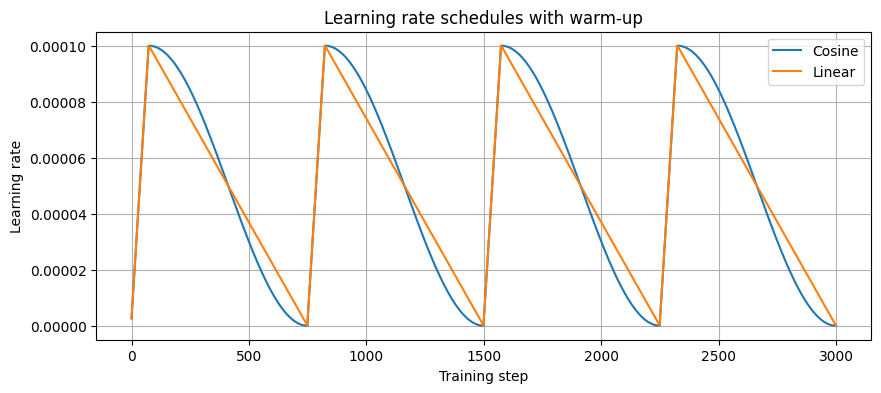

In [45]:
plt.figure(figsize=(10, 4))
for scheduler_name, lr_hist in lr_curves.items():
    plt.plot(lr_hist, label=scheduler_name.capitalize())

plt.xlabel("Training step")
plt.ylabel("Learning rate")
plt.title("Learning rate schedules with warm-up")
plt.legend()
plt.grid(True)
plt.show()

This is plot how learning rate changes

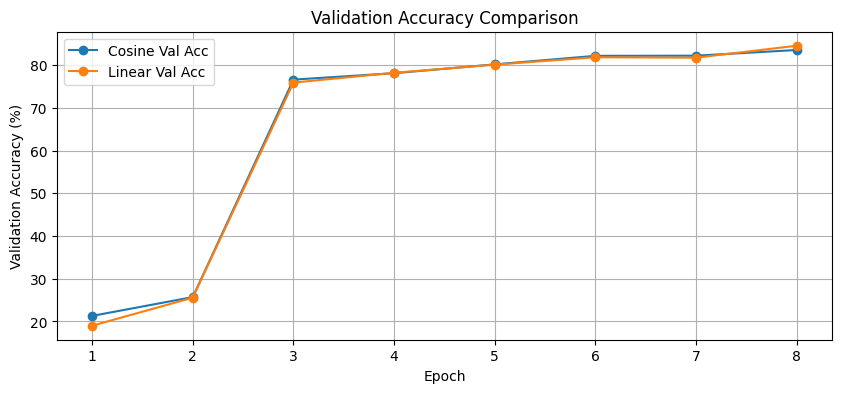

In [46]:
all_hist_df = pd.concat(histories_progressive, ignore_index=True)

plt.figure(figsize=(10, 4))
for scheduler_name in all_hist_df["scheduler"].unique():
    subset = all_hist_df[all_hist_df["scheduler"] == scheduler_name]
    plt.plot(subset["epoch"], subset["val_acc"], marker='o', label=f"{scheduler_name.capitalize()} Val Acc")

plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Validation Accuracy Comparison")
plt.legend()
plt.grid(True)
plt.show()

and this is plot how validation accuracy changes

# Wandb

In [ ]:
wandb.login()

wandb: Currently logged in as: ivanyshyn-pn (ivanyshyn-pn-ukrainian-catholic-university) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

Sucsessfully lodined

In [ ]:
manual_configs = [
    {"lr": 1e-4, "weight_decay": 1e-4, "dropout": 0.0, "optimizer": "adamw", "epochs": 4},
    {"lr": 1e-4, "weight_decay": 1e-4, "dropout": 0.3, "optimizer": "adamw", "epochs": 4},
    {"lr": 3e-4, "weight_decay": 1e-5, "dropout": 0.0, "optimizer": "adamw", "epochs": 4},
    {"lr": 3e-4, "weight_decay": 1e-5, "dropout": 0.3, "optimizer": "adamw", "epochs": 4},
]


val_loader = DataLoader(
    val_subset, batch_size=64, shuffle=False, num_workers=0
)
train_loader = DataLoader(
    train_subset, batch_size=32, shuffle=True, num_workers=0, drop_last=True
)
test_loader = DataLoader(
    test_20, batch_size=64, shuffle=False, num_workers=0
)
part_train_loader = DataLoader(
    torch.utils.data.Subset(train_subset, list(range(3000))), batch_size=32, shuffle=True, num_workers=0, drop_last=True
)
if hasattr(train_subset.dataset, "classes"):
    num_classes = len(train_subset.dataset.classes)
else:
    num_classes = 20 

print("num_classes =", num_classes)


def build_resnet(num_classes, dropout=0.0, pretrained=True):
    model = models.resnet18(
        weights=models.ResNet18_Weights.DEFAULT if pretrained else None
    )
    in_features = model.fc.in_features

    if dropout > 0:
        model.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(in_features, num_classes)
        )
    else:
        model.fc = nn.Linear(in_features, num_classes)

    return model


def run_experiment(config, train_loader, val_loader, num_classes, project_name, run_name):
    use_mixer = bool(config.get("use_mixer", True))
    run_config = dict(config)
    run_config["use_mixer"] = use_mixer

    wandb_run = wandb.init(
        project=project_name,
        name=run_name,
        config=run_config,
        reinit=True
    )

    cfg = wandb.config
    model = build_resnet(num_classes=num_classes, dropout=cfg.dropout, pretrained=True).to(device)
    criterion = nn.CrossEntropyLoss()

    if cfg.optimizer.lower() == "adamw":
        optimizer = optim.AdamW(
            model.parameters(),
            lr=cfg.lr,
            weight_decay=cfg.weight_decay
        )
    else:
        wandb.finish()
        raise ValueError(f"Unsupported optimizer: {cfg.optimizer}")

    best_val_acc = 0.0
    best_model_wts = copy.deepcopy(model.state_dict())
    history = []
    start_time = time.time()

    for epoch in range(cfg.epochs):
        model.train()
        running_loss = 0.0
        running_correct = 0
        running_total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            if use_mixer:
                images, mixed_labels = cutmix_or_mixup(images, labels)
                outputs = model(images)
                if mixed_labels.ndim == 2:
                    loss = -(mixed_labels * F.log_softmax(outputs, dim=1)).sum(dim=1).mean()
                else:
                    loss = criterion(outputs, mixed_labels)
            else:
                outputs = model(images)
                loss = criterion(outputs, labels)

            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            preds = outputs.argmax(dim=1)
            running_correct += (preds == labels).sum().item()
            running_total += labels.size(0)

        train_loss = running_loss / running_total
        train_acc = 100.0 * running_correct / running_total

        val_loss, val_acc = evaluate(model, val_loader, criterion, device)

        wandb.log({
            "epoch": epoch + 1,
            "train_loss": train_loss,
            "train_acc": train_acc,
            "val_loss": val_loss,
            "val_acc": val_acc,
            "lr": optimizer.param_groups[0]["lr"],
            "use_mixer": int(use_mixer),
        })

        history.append({
            "epoch": epoch + 1,
            "train_loss": train_loss,
            "train_acc": train_acc,
            "val_loss": val_loss,
            "val_acc": val_acc,
            "use_mixer": use_mixer,
        })

        print(
            f"[{run_name}] Epoch {epoch+1}/{cfg.epochs} | "
            f"train_loss={train_loss:.4f}, train_acc={train_acc:.2f}% | "
            f"val_loss={val_loss:.4f}, val_acc={val_acc:.2f}% | "
            f"mixer={use_mixer}"
        )

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_model_wts = copy.deepcopy(model.state_dict())

    duration = time.time() - start_time
    model.load_state_dict(best_model_wts)

    wandb.summary["best_val_acc"] = best_val_acc
    wandb.summary["train_time_sec"] = duration
    wandb.summary["use_mixer"] = use_mixer

    wandb.finish()

    return model, history, best_val_acc, duration

project_name = "food101-experiments"

search_results = []
all_histories = []

for i, cfg in enumerate(manual_configs, start=1):
    run_name = f"search_run_{i}"
    model, history, best_val_acc, duration = run_experiment(
        config=cfg,
        train_loader=part_train_loader,
        val_loader=val_loader,
        num_classes=num_classes,
        project_name=project_name,
        run_name=run_name
    )

    search_results.append({
        "run_name": run_name,
        "lr": cfg["lr"],
        "weight_decay": cfg["weight_decay"],
        "dropout": cfg["dropout"],
        "optimizer": cfg["optimizer"],
        "epochs": cfg["epochs"],
        "use_mixer": cfg.get("use_mixer", True),
        "best_val_acc": best_val_acc,
        "train_time_sec": duration,
    })

    hist_df = pd.DataFrame(history)
    hist_df["run_name"] = run_name
    all_histories.append(hist_df)

df_search = pd.DataFrame(search_results).sort_values("best_val_acc", ascending=False).reset_index(drop=True)
df_search


num_classes = 20


[search_run_1] Epoch 1/4 | train_loss=2.4585, train_acc=26.55% | val_loss=1.3224, val_acc=64.37% | mixer=True
[search_run_1] Epoch 2/4 | train_loss=1.8708, train_acc=41.97% | val_loss=1.1116, val_acc=70.73% | mixer=True
[search_run_1] Epoch 3/4 | train_loss=1.7337, train_acc=51.44% | val_loss=0.9974, val_acc=73.43% | mixer=True
[search_run_1] Epoch 4/4 | train_loss=1.6287, train_acc=47.04% | val_loss=1.0245, val_acc=73.53% | mixer=True


epoch,▁▃▆█
lr,▁▁▁▁
train_acc,▁▅█▇
train_loss,█▃▂▁
use_mixer,▁▁▁▁
val_acc,▁▆██
val_loss,█▃▁▂
best_val_acc,73.53333
epoch,4
lr,0.0001
train_acc,47.04301


[search_run_2] Epoch 1/4 | train_loss=2.5390, train_acc=24.87% | val_loss=1.3435, val_acc=63.90% | mixer=True
[search_run_2] Epoch 2/4 | train_loss=1.8531, train_acc=38.64% | val_loss=1.0969, val_acc=71.57% | mixer=True
[search_run_2] Epoch 3/4 | train_loss=1.8149, train_acc=45.53% | val_loss=1.0567, val_acc=72.33% | mixer=True
[search_run_2] Epoch 4/4 | train_loss=1.7180, train_acc=48.49% | val_loss=0.9826, val_acc=75.43% | mixer=True


epoch,▁▃▆█
lr,▁▁▁▁
train_acc,▁▅▇█
train_loss,█▂▂▁
use_mixer,▁▁▁▁
val_acc,▁▆▆█
val_loss,█▃▂▁
best_val_acc,75.43333
epoch,4
lr,0.0001
train_acc,48.4879


[search_run_3] Epoch 1/4 | train_loss=2.1868, train_acc=24.97% | val_loss=1.3178, val_acc=61.73% | mixer=True
[search_run_3] Epoch 2/4 | train_loss=1.7767, train_acc=45.73% | val_loss=1.1501, val_acc=66.87% | mixer=True
[search_run_3] Epoch 3/4 | train_loss=1.7567, train_acc=43.68% | val_loss=1.2198, val_acc=66.47% | mixer=True
[search_run_3] Epoch 4/4 | train_loss=1.5148, train_acc=52.55% | val_loss=1.1973, val_acc=66.73% | mixer=True


epoch,▁▃▆█
lr,▁▁▁▁
train_acc,▁▆▆█
train_loss,█▄▄▁
use_mixer,▁▁▁▁
val_acc,▁█▇█
val_loss,█▁▄▃
best_val_acc,66.86667
epoch,4
lr,0.0003
train_acc,52.55376


[search_run_4] Epoch 1/4 | train_loss=2.3643, train_acc=25.71% | val_loss=1.5140, val_acc=55.60% | mixer=True
[search_run_4] Epoch 2/4 | train_loss=1.9173, train_acc=42.74% | val_loss=1.2680, val_acc=64.40% | mixer=True
[search_run_4] Epoch 3/4 | train_loss=1.7882, train_acc=41.06% | val_loss=1.1676, val_acc=67.27% | mixer=True
[search_run_4] Epoch 4/4 | train_loss=1.6649, train_acc=52.02% | val_loss=1.1280, val_acc=68.13% | mixer=True


epoch,▁▃▆█
lr,▁▁▁▁
train_acc,▁▆▅█
train_loss,█▄▂▁
use_mixer,▁▁▁▁
val_acc,▁▆██
val_loss,█▄▂▁
best_val_acc,68.13333
epoch,4
lr,0.0003
train_acc,52.01613


,run_name,lr,weight_decay,dropout,optimizer,epochs,use_mixer,best_val_acc,train_time_sec
0,search_run_2,0.0001,0.00010,0.3,adamw,4,True,75.433333,176.875124
1,search_run_1,0.0001,0.00010,0.0,adamw,4,True,73.533333,156.414322
2,search_run_4,0.0003,0.00001,0.3,adamw,4,True,68.133333,185.402429
3,search_run_3,0.0003,0.00001,0.0,adamw,4,True,66.866667,178.932076


Here all results reported on wandb and saved to pdf. I have defined a list of 4 specific dictionaries containing different combinations of Learning Rate (lr) and dropout and keep low number of epochs to quiqc search. Instead of running the sweep on the full dataset torch.utils.data.Subset(train_subset, list(range(3000))) to grab just the first 3,000 images. I have also take here resnet18. Also I have tried differen weight decays for optimizer, it acts like a "tax" on the model's weights, forces the model to keep its internal weights as close to zero as possible. As we can see, the best result give 2 run with "lr": 1e-4, "weight_decay": 1e-4, "dropout": 0.3. After I have run 2 best sets on 10 epochs and 2 run still the best of those 4.

[final_best_model_10_epochs] Epoch 1/10 | train_loss=2.1109, train_acc=36.05% | val_loss=0.9268, val_acc=75.87% | mixer=True
[final_best_model_10_epochs] Epoch 2/10 | train_loss=1.7824, train_acc=44.59% | val_loss=0.7952, val_acc=80.03% | mixer=True
[final_best_model_10_epochs] Epoch 3/10 | train_loss=1.6475, train_acc=45.98% | val_loss=0.7460, val_acc=81.00% | mixer=True
[final_best_model_10_epochs] Epoch 4/10 | train_loss=1.6033, train_acc=48.36% | val_loss=0.7058, val_acc=82.83% | mixer=True
[final_best_model_10_epochs] Epoch 5/10 | train_loss=1.5306, train_acc=52.02% | val_loss=0.7100, val_acc=81.43% | mixer=True
[final_best_model_10_epochs] Epoch 6/10 | train_loss=1.5159, train_acc=55.26% | val_loss=0.6764, val_acc=83.50% | mixer=True
[final_best_model_10_epochs] Epoch 7/10 | train_loss=1.4886, train_acc=53.36% | val_loss=0.6665, val_acc=84.53% | mixer=True
[final_best_model_10_epochs] Epoch 8/10 | train_loss=1.3957, train_acc=51.98% | val_loss=0.7288, val_acc=82.97% | mixer=True


epoch,▁▂▃▃▄▅▆▆▇█
lr,▁▁▁▁▁▁▁▁▁▁
train_acc,▁▄▄▅▆▇▆▆█▇
train_loss,█▅▄▃▃▂▂▁▁▁
use_mixer,▁▁▁▁▁▁▁▁▁▁
val_acc,▁▄▅▇▅▇█▇▇█
val_loss,█▅▃▂▃▂▂▃▁▃
best_val_acc,84.53333
epoch,10
lr,0.0001
train_acc,55.08333


Best Val Acc: 84.53%

evaluating on test
Test Accuracy: 87.46%


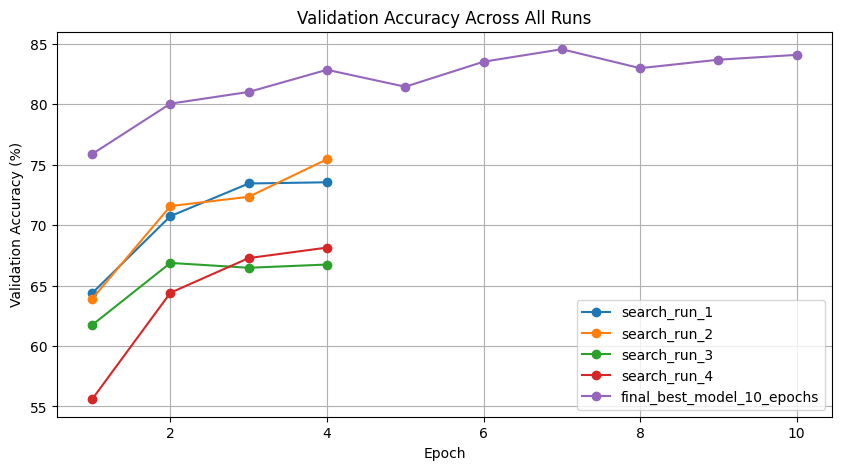

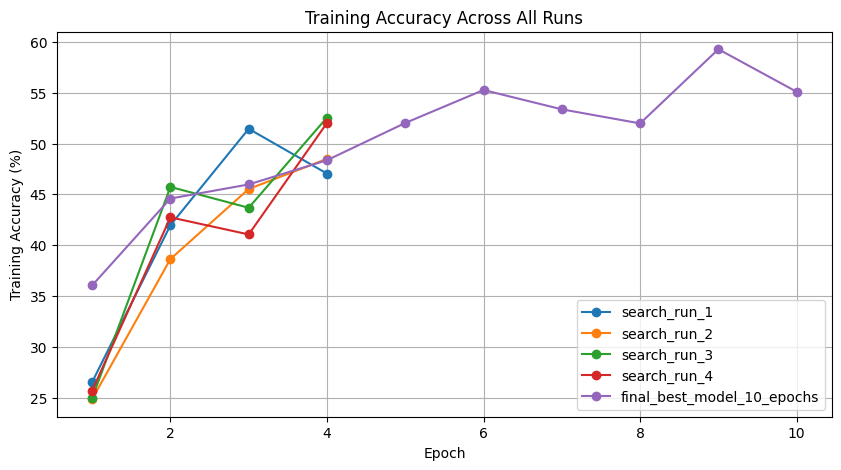

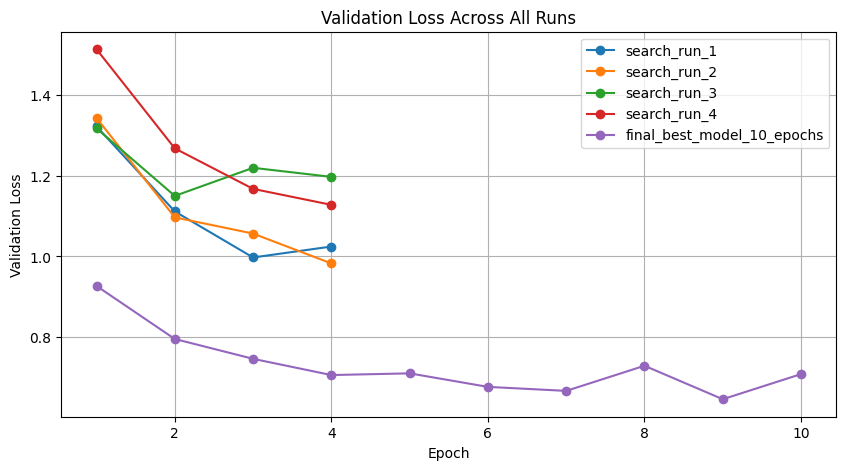

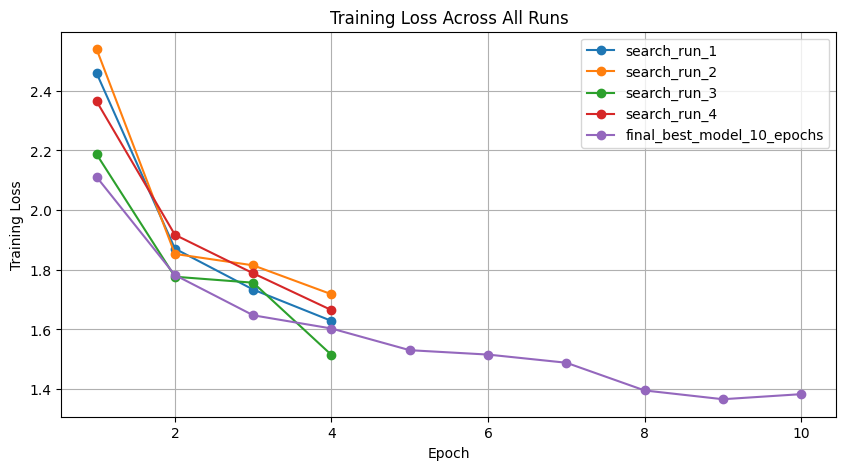

In [ ]:
final_config = {
    "lr": 1e-4, 
    "weight_decay": 1e-4, 
    "dropout": 0.3, 
    "optimizer": "adamw", 
    "epochs": 10,
    "use_mixer": True
}

final_run_name = "final_best_model_10_epochs"

final_model, final_history, final_val_acc, final_duration = run_experiment(
    config=final_config,
    train_loader=train_loader,
    val_loader=val_loader,
    num_classes=num_classes,
    project_name=project_name,
    run_name=final_run_name
)

print(f"Best Val Acc: {final_val_acc:.2f}%")

print("\nevaluating on test")
final_model.eval()
test_loss, test_acc = evaluate(final_model, test_loader, nn.CrossEntropyLoss(), device)
print(f"Test Accuracy: {test_acc:.2f}%")

final_hist_df = pd.DataFrame(final_history)
final_hist_df["run_name"] = final_run_name
all_histories.append(final_hist_df)

all_runs_hist_df = pd.concat(all_histories, ignore_index=True)

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["val_acc"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Validation Accuracy Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["train_acc"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Training Accuracy (%)")
plt.title("Training Accuracy Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["val_loss"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.title("Validation Loss Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["train_loss"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("Training Loss Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

[final_best_model_10_epochs_no_dropout] Epoch 1/10 | train_loss=1.9949, train_acc=37.55% | val_loss=0.8827, val_acc=76.93% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 2/10 | train_loss=1.6707, train_acc=47.49% | val_loss=0.7871, val_acc=79.17% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 3/10 | train_loss=1.5909, train_acc=52.27% | val_loss=0.7428, val_acc=81.53% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 4/10 | train_loss=1.5189, train_acc=52.30% | val_loss=0.6973, val_acc=82.77% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 5/10 | train_loss=1.4844, train_acc=54.04% | val_loss=0.7296, val_acc=82.20% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 6/10 | train_loss=1.4220, train_acc=53.39% | val_loss=0.7076, val_acc=83.10% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 7/10 | train_loss=1.4039, train_acc=56.04% | val_loss=0.6630, val_acc=83.87% | mixer=True
[final_best_model_10_epochs_no_dropout] Epoch 8/

epoch,▁▂▃▃▄▅▆▆▇█
lr,▁▁▁▁▁▁▁▁▁▁
train_acc,▁▄▅▅▆▆▆▆▇█
train_loss,█▅▄▃▃▂▂▂▂▁
use_mixer,▁▁▁▁▁▁▁▁▁▁
val_acc,▁▃▆▇▆▇███▇
val_loss,█▅▄▂▃▃▁▁▂▂
best_val_acc,83.86667
epoch,10
lr,0.0001
train_acc,61.93333


Best Val Acc: 83.87%

evaluating on test
Test Accuracy: 87.54%


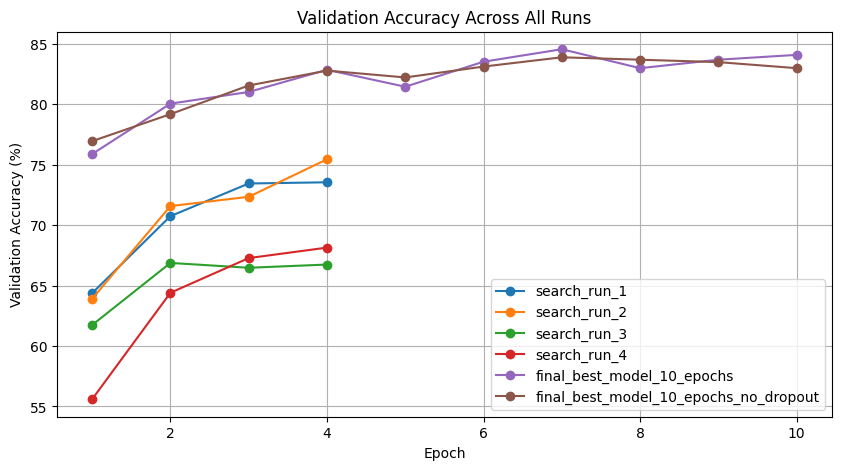

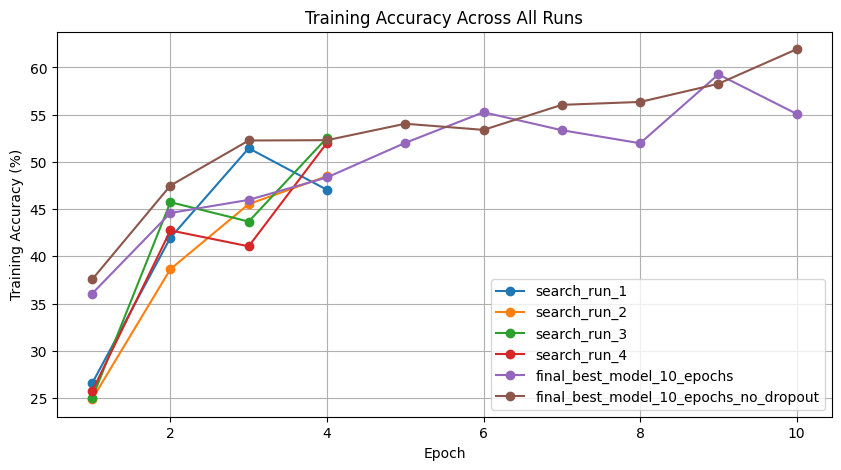

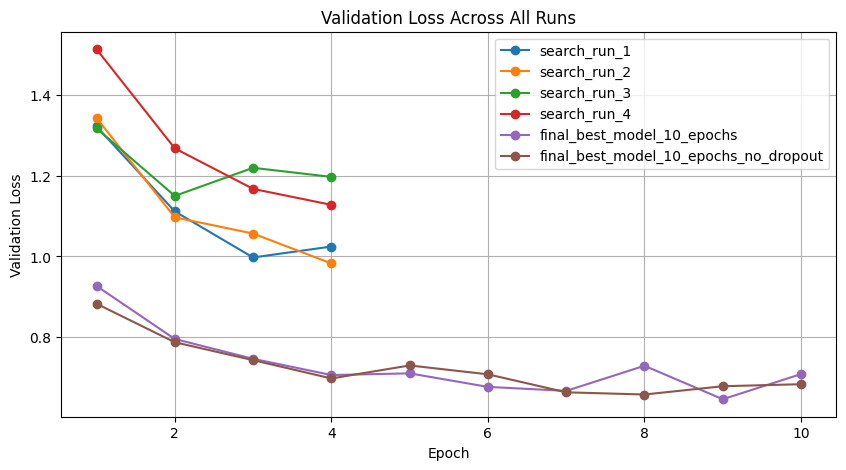

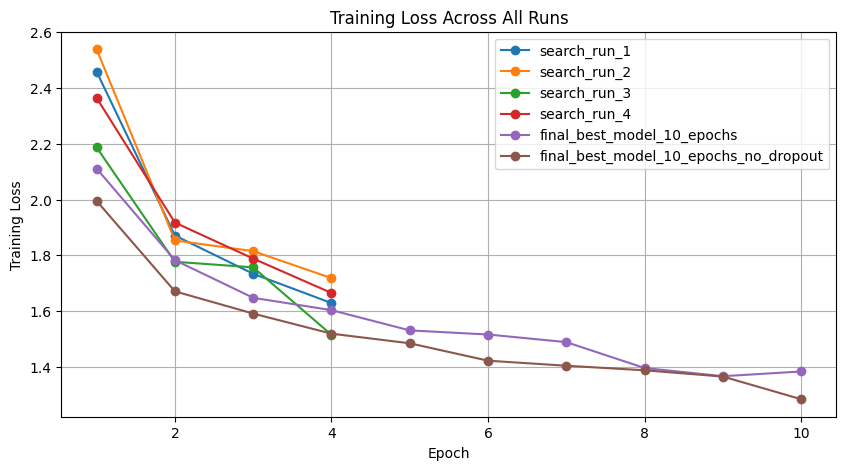

In [29]:
final_config = {
    "lr": 1e-4, 
    "weight_decay": 1e-4, 
    "dropout": 0, 
    "optimizer": "adamw", 
    "epochs": 10,
    "use_mixer": True
}

final_run_name = "final_best_model_10_epochs_no_dropout"

final_model, final_history, final_val_acc, final_duration = run_experiment(
    config=final_config,
    train_loader=train_loader,
    val_loader=val_loader,
    num_classes=num_classes,
    project_name=project_name,
    run_name=final_run_name
)

print(f"Best Val Acc: {final_val_acc:.2f}%")

print("\nevaluating on test")
final_model.eval()
test_loss, test_acc = evaluate(final_model, test_loader, nn.CrossEntropyLoss(), device)
print(f"Test Accuracy: {test_acc:.2f}%")

final_hist_df = pd.DataFrame(final_history)
final_hist_df["run_name"] = final_run_name
all_histories.append(final_hist_df)

all_runs_hist_df = pd.concat(all_histories, ignore_index=True)

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["val_acc"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Validation Accuracy (%)")
plt.title("Validation Accuracy Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["train_acc"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Training Accuracy (%)")
plt.title("Training Accuracy Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["val_loss"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Validation Loss")
plt.title("Validation Loss Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
for run_name in all_runs_hist_df["run_name"].unique():
    subset = all_runs_hist_df[all_runs_hist_df["run_name"] == run_name]
    plt.plot(subset["epoch"], subset["train_loss"], marker="o", label=run_name)
plt.xlabel("Epoch")
plt.ylabel("Training Loss")
plt.title("Training Loss Across All Runs")
plt.grid(True)
plt.legend()
plt.show()

# Ensembling

In [ ]:
if "device" not in globals():
    device = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")
print("Device:", device)

MODEL_NAMES = ["resnet", "efficientnet", "vit"]
MODEL_DIR = "saved_models"

if hasattr(train_subset.dataset, "classes"):
    num_classes = len(train_subset.dataset.classes)
else:
    num_classes = 20 

print("num_classes =", num_classes)


def build_model_from_checkpoint(name: str, state_dict, num_classes: int):
    name = name.lower()

    if name == "resnet":
        fc_in = state_dict["fc.weight"].shape[1]
        if fc_in == 2048:
            model = models.resnet50(weights=None)
        elif fc_in == 512:
            model = models.resnet18(weights=None)
        else:
            raise ValueError(f"Unsupported ResNet checkpoint fc.in_features={fc_in}")
        model.fc = nn.Linear(fc_in, num_classes)

    elif name == "efficientnet":
        model = models.efficientnet_b0(weights=None)
        in_features = model.classifier[1].in_features
        model.classifier[1] = nn.Linear(in_features, num_classes)

    elif name == "vit":
        model = models.vit_b_16(weights=None)
        in_features = model.heads.head.in_features
        model.heads.head = nn.Linear(in_features, num_classes)

    else:
        raise ValueError(f"Unknown model name: {name}")

    return model

def load_saved_models(model_names, num_classes, model_dir, device):
    models_dict = {}

    for name in model_names:
        ckpt_path = os.path.join(model_dir, f"{name}_best.pth")

        if not os.path.exists(ckpt_path):
            raise FileNotFoundError(f"Checkpoint not found: {ckpt_path}")

        state_dict = torch.load(ckpt_path, map_location=device)
        model = build_model_from_checkpoint(name, state_dict, num_classes)
        model.load_state_dict(state_dict)
        model.to(device)
        model.eval()

        models_dict[name] = model
        print(f"Loaded {name} from {ckpt_path}")

    return models_dict


@torch.no_grad()
def collect_logits_and_labels(model, loader, device):
    model.eval()
    all_logits = []
    all_labels = []

    for images, labels in loader:
        images = images.to(device)
        logits = model(images)

        all_logits.append(logits.cpu())
        all_labels.append(labels.cpu())

    all_logits = torch.cat(all_logits, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    return all_logits, all_labels


def metrics_from_logits(logits, labels):
    preds = logits.argmax(dim=1).numpy()
    y_true = labels.numpy()

    acc = accuracy_score(y_true, preds) * 100.0
    precision, recall, f1, _ = precision_recall_fscore_support(
        y_true, preds, average="macro", zero_division=0
    )

    return {
        "acc": acc,
        "precision": precision * 100.0,
        "recall": recall * 100.0,
        "f1": f1 * 100.0
    }


def fit_temperature(logits, labels):
    logits_np = logits.numpy()
    labels_np = labels.numpy()

    def objective(x):
        T = float(x[0])
        T = max(T, 1e-4)

        scaled_logits = torch.tensor(logits_np / T, dtype=torch.float32)
        targets = torch.tensor(labels_np, dtype=torch.long)
        loss = F.cross_entropy(scaled_logits, targets).item()
        return loss

    result = minimize(
        objective,
        x0=[1.0],
        bounds=[(0.05, 10.0)],
        method="L-BFGS-B"
    )

    T_opt = float(result.x[0])
    return T_opt


def fit_ensemble_weights(logits_list, labels):
    labels_np = labels.numpy()
    probs_list = [F.softmax(logits, dim=1).numpy() for logits in logits_list]
    n_models = len(probs_list)

    def objective(weights):
        weights = np.maximum(weights, 1e-12)
        weights = weights / weights.sum()

        ensemble_probs = np.zeros_like(probs_list[0])
        for w, probs in zip(weights, probs_list):
            ensemble_probs += w * probs

        ensemble_probs = np.clip(ensemble_probs, 1e-12, 1.0)
        nll = -np.log(ensemble_probs[np.arange(len(labels_np)), labels_np]).mean()
        return nll

    x0 = np.ones(n_models) / n_models
    bounds = [(0.0, 1.0)] * n_models
    constraints = [{"type": "eq", "fun": lambda w: np.sum(w) - 1.0}]

    result = minimize(
        objective,
        x0=x0,
        bounds=bounds,
        constraints=constraints,
        method="SLSQP"
    )

    weights = result.x
    weights = np.maximum(weights, 1e-12)
    weights = weights / weights.sum()
    return weights


def weighted_ensemble_logits(logits_list, weights):
    ensemble_probs = 0
    for w, logits in zip(weights, logits_list):
        ensemble_probs += w * F.softmax(logits, dim=1)
    return torch.log(ensemble_probs + 1e-12)


def temp_scaled_weighted_ensemble_logits(logits_list, temperatures, weights):
    ensemble_probs = 0
    for w, T, logits in zip(weights, temperatures, logits_list):
        ensemble_probs += w * F.softmax(logits / T, dim=1)
    return torch.log(ensemble_probs + 1e-12)


def run_5fold_cv_for_ensemble(train_dataset, models_dict, device, batch_size=64):
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    indices = np.arange(len(train_dataset))

    fold_rows = []
    all_weights = []
    all_temperatures = []

    for fold, (_, val_idx) in enumerate(kf.split(indices), start=1):
        print(f"\nFold {fold}/5")

        val_subset_fold = Subset(train_dataset, val_idx)
        val_loader_fold = DataLoader(
            val_subset_fold, batch_size=batch_size, shuffle=False, num_workers=0
        )

        logits_dict = {}
        labels_ref = None

        for name, model in models_dict.items():
            logits, labels = collect_logits_and_labels(model, val_loader_fold, device)
            logits_dict[name] = logits
            if labels_ref is None:
                labels_ref = labels

        logits_list = [logits_dict[name] for name in MODEL_NAMES]

        single_metrics = {}
        for name in MODEL_NAMES:
            m = metrics_from_logits(logits_dict[name], labels_ref)
            single_metrics[name] = m

        weights = fit_ensemble_weights(logits_list, labels_ref)
        all_weights.append(weights)

        weighted_logits = weighted_ensemble_logits(logits_list, weights)
        weighted_metrics = metrics_from_logits(weighted_logits, labels_ref)

        temperatures = []
        for name in MODEL_NAMES:
            T = fit_temperature(logits_dict[name], labels_ref)
            temperatures.append(T)
        all_temperatures.append(temperatures)

        temp_weighted_logits = temp_scaled_weighted_ensemble_logits(
            logits_list, temperatures, weights
        )
        temp_weighted_metrics = metrics_from_logits(temp_weighted_logits, labels_ref)

        row = {
            "fold": fold,

            "resnet_acc": single_metrics["resnet"]["acc"],
            "efficientnet_acc": single_metrics["efficientnet"]["acc"],
            "vit_acc": single_metrics["vit"]["acc"],

            "weighted_acc": weighted_metrics["acc"],
            "temp_weighted_acc": temp_weighted_metrics["acc"],

            "weights": weights,
            "temperatures": temperatures
        }

        fold_rows.append(row)

        print("Single model accuracies:")
        print({
            name: round(single_metrics[name]["acc"], 2)
            for name in MODEL_NAMES
        })
        print("Weights:", np.round(weights, 4))
        print("Temperatures:", np.round(temperatures, 4))
        print("Weighted ensemble acc:", round(weighted_metrics["acc"], 2))
        print("Temp-scaled weighted ensemble acc:", round(temp_weighted_metrics["acc"], 2))

    df_cv = pd.DataFrame(fold_rows)

    mean_weights = np.mean(np.vstack(all_weights), axis=0)
    mean_weights = mean_weights / mean_weights.sum()

    mean_temperatures = np.mean(np.vstack(all_temperatures), axis=0)

    return df_cv, mean_weights, mean_temperatures


def evaluate_on_test(test_dataset, models_dict, device, mean_weights, mean_temperatures, batch_size=64):
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

    logits_dict = {}
    labels_ref = None

    for name, model in models_dict.items():
        logits, labels = collect_logits_and_labels(model, test_loader, device)
        logits_dict[name] = logits
        if labels_ref is None:
            labels_ref = labels

    rows = []

    for name in MODEL_NAMES:
        m = metrics_from_logits(logits_dict[name], labels_ref)
        rows.append({
            "Model": name,
            "Accuracy (%)": m["acc"],
            "Precision (%)": m["precision"],
            "Recall (%)": m["recall"],
            "F1 (%)": m["f1"]
        })

    logits_list = [logits_dict[name] for name in MODEL_NAMES]

    weighted_logits = weighted_ensemble_logits(logits_list, mean_weights)
    m_weighted = metrics_from_logits(weighted_logits, labels_ref)
    rows.append({
        "Model": "weighted_ensemble",
        "Accuracy (%)": m_weighted["acc"],
        "Precision (%)": m_weighted["precision"],
        "Recall (%)": m_weighted["recall"],
        "F1 (%)": m_weighted["f1"]
    })

    temp_weighted_logits = temp_scaled_weighted_ensemble_logits(
        logits_list, mean_temperatures, mean_weights
    )
    m_temp = metrics_from_logits(temp_weighted_logits, labels_ref)
    rows.append({
        "Model": "temp_scaled_weighted_ensemble",
        "Accuracy (%)": m_temp["acc"],
        "Precision (%)": m_temp["precision"],
        "Recall (%)": m_temp["recall"],
        "F1 (%)": m_temp["f1"]
    })

    df_test = pd.DataFrame(rows)
    return df_test


models_dict = load_saved_models(
    model_names=MODEL_NAMES,
    num_classes=num_classes,
    model_dir=MODEL_DIR,
    device=device
)

df_cv, mean_weights, mean_temperatures = run_5fold_cv_for_ensemble(
    train_dataset=train_subset,
    models_dict=models_dict,
    device=device,
    batch_size=64
)

print(df_cv[[
    "fold", "resnet_acc", "efficientnet_acc", "vit_acc",
    "weighted_acc", "temp_weighted_acc"
]].to_string(index=False))

print("\nMean weights:")
for name, w in zip(MODEL_NAMES, mean_weights):
    print(f"{name}: {w:.4f}")

print("\nMean temperatures:")
for name, T in zip(MODEL_NAMES, mean_temperatures):
    print(f"{name}: {T:.4f}")

df_test = evaluate_on_test(
    test_dataset=test_20,
    models_dict=models_dict,
    device=device,
    mean_weights=mean_weights,
    mean_temperatures=mean_temperatures,
    batch_size=64
)

print(df_test.to_string(index=False))

Device: mps
num_classes = 20


Loaded resnet from saved_models/resnet_best.pth
Loaded efficientnet from saved_models/efficientnet_best.pth
Loaded vit from saved_models/vit_best.pth

Fold 1/5
Single model accuracies:
{'resnet': 98.25, 'efficientnet': 95.04, 'vit': 95.92}
Weights: [0.3333 0.3333 0.3333]
Temperatures: [1. 1. 1.]
Weighted ensemble acc: 97.96
Temp-scaled weighted ensemble acc: 97.96

Fold 2/5
Single model accuracies:
{'resnet': 98.21, 'efficientnet': 94.75, 'vit': 95.46}
Weights: [0.3333 0.3333 0.3333]
Temperatures: [1. 1. 1.]
Weighted ensemble acc: 98.21
Temp-scaled weighted ensemble acc: 98.21

Fold 3/5
Single model accuracies:
{'resnet': 98.12, 'efficientnet': 94.62, 'vit': 95.88}
Weights: [0.3333 0.3333 0.3333]
Temperatures: [1. 1. 1.]
Weighted ensemble acc: 98.25
Temp-scaled weighted ensemble acc: 98.25

Fold 4/5
Single model accuracies:
{'resnet': 98.5, 'efficientnet': 94.75, 'vit': 96.21}
Weights: [0.3334 0.3334 0.3331]
Temperatures: [1. 1. 1.]
Weighted ensemble acc: 98.33
Temp-scaled weighted ens

I take 3 best models from second task. 

Use collect_logits_and_labels to collects raw logits and the true labels. Working with raw logits is crucial for the math in the next steps. 

fit_ensemble_weights uses SciPy's minimize algorithm to find the mathematically optimal weights for models, It tests different fractional weights to see which combination minimizes the "Negative Log-Likelihood". 

fit_temperature takes the raw logits and divides them by a variable T (Temperature) before converting them to probabilities, If $T > 1$, it softens the model's confidence. The code uses an optimizer to find the perfect T that makes the model's confidence actually match its true accuracy. This is because model can be overconfident and ruin ensembles.

run_5fold_cv_for_ensemble chops your training data into 5 equal slices, it uses 4 slices to represent training and the remaining 1 slice as a validation set. It figures out the best weights and temperatures on that validation slice. Repeat this 5 times, shifting the validation slice each time by 1. And calculating average weights and temparatures over all folds.

As we can see in results the optimization algorithms for ensemble weighting and temperature scaling converged on a simple, equal-weight distribution (~33% per model) and a temperature of 1.0. This indicates that the base models were already well-calibrated and that a simple, unweighted average was the most robust method to prevent overfitting. Also it gives big improving of results from second task + 1.2 percents.

# GradCam

found 10 disagreement images


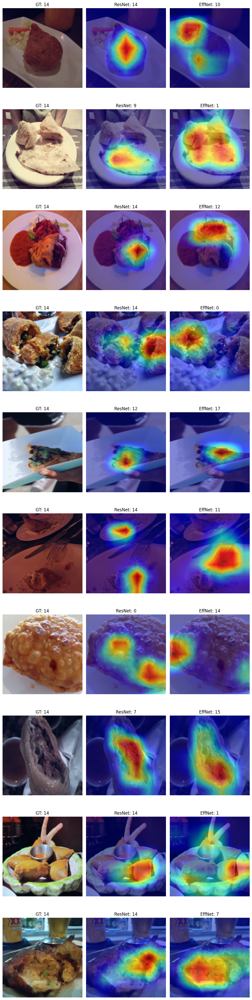

In [ ]:
def build_model(name, num_classes):
    if name == "resnet":
        model = models.resnet50(weights=None)
        model.fc = nn.Linear(model.fc.in_features, num_classes)
    elif name == "efficientnet":
        model = models.efficientnet_b0(weights=None)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
    else:
        raise ValueError(name)
    return model

num_classes = len(train_subset.dataset.classes) if hasattr(train_subset.dataset, "classes") else 20
class_names = train_subset.dataset.classes if hasattr(train_subset.dataset, "classes") else [str(i) for i in range(num_classes)]

resnet = build_model("resnet", num_classes)
efficientnet = build_model("efficientnet", num_classes)

resnet.load_state_dict(torch.load("saved_models/resnet_best.pth", map_location=device))
efficientnet.load_state_dict(torch.load("saved_models/efficientnet_best.pth", map_location=device))

resnet.to(device).eval()
efficientnet.to(device).eval()

test_loader = DataLoader(test_20, batch_size=1, shuffle=False)

disagreements = []
with torch.no_grad():
    for img, label in test_loader:
        img = img.to(device)

        pred_r = resnet(img).argmax(dim=1).item()
        pred_e = efficientnet(img).argmax(dim=1).item()
        y = label.item()

        if pred_r != pred_e:
            disagreements.append((img.cpu(), y, pred_r, pred_e))
        if len(disagreements) == 10:   
            break

print(f"found {len(disagreements)} disagreement images")

cam_resnet = GradCAM(model=resnet, target_layers=[resnet.layer4[-1]])
cam_efficientnet = GradCAM(model=efficientnet, target_layers=[efficientnet.features[-1]])

fig, axes = plt.subplots(len(disagreements), 3, figsize=(10, 4 * len(disagreements)))
if len(disagreements) == 1:
    axes = [axes]

for i, (img_cpu, y, pred_r, pred_e) in enumerate(disagreements):
    img = img_cpu.to(device)
    rgb = img_cpu[0].permute(1, 2, 0).numpy()
    rgb = (rgb - rgb.min()) / (rgb.max() - rgb.min() + 1e-8)

    cam_r = cam_resnet(input_tensor=img, targets=[ClassifierOutputTarget(pred_r)])[0]
    cam_e = cam_efficientnet(input_tensor=img, targets=[ClassifierOutputTarget(pred_e)])[0]

    vis_r = show_cam_on_image(rgb, cam_r, use_rgb=True)
    vis_e = show_cam_on_image(rgb, cam_e, use_rgb=True)

    axes[i][0].imshow(rgb)
    axes[i][0].set_title(f"GT: {class_names[y]}")
    axes[i][1].imshow(vis_r)
    axes[i][1].set_title(f"ResNet: {class_names[pred_r]}")
    axes[i][2].imshow(vis_e)
    axes[i][2].set_title(f"EffNet: {class_names[pred_e]}")

    for j in range(3):
        axes[i][j].axis("off")

plt.tight_layout()
plt.show()

Here we have used gradcam to see where models sees the most important points on the photo. As we can see Resnet more like to see on the dishes and preferably on its center, while effnet likes to see on the corners and other things like fork, plate, figers. Resnet mostly has short range of concentration while Effnet could have a big one.